# Analytics Project: Network Analysis of Financial Security Settlement Network

## Introduction

This project is situated in the context of financial securities trading (stocks, bonds, derivatives), more specifically in the settlement of securities. The lifecycle of a trade (for example on the stock market) consists of different steps, such as pre-trade, trade execution, trade clearing, trade settlement and post-settlement activities. In the settlement phase, ownership of the security being traded is transferred between the two participants (financial institutions). 

Within the complex environment of the global financial markets, the Financial Market Infrastructure (FMI) provided by Euroclear Bank serves an essential role in ensuring the seamless execution, stability, and efficiency of cross-border financial transactions. As a leading International Central Securities Depository (ICSD), Euroclear Bank facilitates worldwide connectivity by offering post-trade services to counterparties across the world. It covers all sorts of asset types, including bonds, equities, funds and derivatives, with its services extending to over 1.7 million distinct securities. 
The Euroclear group holds €37.6 trillion in assets in custody for over 2000 clients worldwide. The operations process 295 million transactions per year cumulating in a value of €1 quadrillion. 

This project builds on the results of the master's thesis "Innovating Financial Settlement Processes through Advanced Simulation and Process Analytics."
in collaboration with Euroclear. In this research, a simulator of the settlement process was built in Python that requires (synthetic) data of the transactions and participants and subsequently runs the settlement process with those transactions. The simulator then generates output analytics such as the efficiency of the run (how much transaction value was able to settle), total credit used by the participants, total value of failed transactions because of shortage of funds on the accounts of the participants. The simulator also generates an event log, that we use for process mining to gain additional insights into the processes. This allows the user to analyze the impact of different parameter settings of the simulator and for example the effect of shocks in the process. Matters investigated in the thesis with the simulator are the impact on the outcomes of the process when the total cycle time (mandatory) is brought down and the impact of different settings on the efficiency of the process.

The goal of this project is to gain additional insight into the dependency of the different transactions and participants by conducting network analysis on the transaction dataset, participant dataset and the resulting event log. In addition to the pefromed research for our master's thesis, it would be interesting to conduct a network analysis on how transactions (edges) occur between participants (nodes) and whether certain tendencies emerge within the network. Given the highly regularised context, high volumes and importance of efficient functioning of financial markets, small improvements in the settlement process can bring great value. This makes research from the perspective of social networks an interesting additional dimension to identify possible additional improvements.

The following research questions will be investigated in this project:
- Who are the key participants in the settlement process, and which are the most central nodes influencing transaction flow?
- How does the settlement network evolve over the course of a processing day?
- Can community detection identify clusters within the settlement network, and which participants or transactions are preventing or enabling settlements?
- Is there a correlation between the centrality of a participant and their settlement efficiency?
- How stable is the settlement network when the most important nodes are removed?



## Data and Methodology

The data is obtained through the simulator system of the research thesis. This requires a synthetic transaction dataset and participant transaction dataset created with the data generator. This input data is fed to the simulator so that the settlement process can be simulated. The result of the simulator is an event log that contains all the steps of the settlement process for each case. The exact content, structure and required preprocessing steps of the data will be shown in detail in the further sections of this report.

Since the input data is an event log, where the network consisting of participants (nodes) sending transactions to each other (edges) changes over time, a temporal network analysis approach was adopted. More specifically, for the analysis of the network, the network is made every 15 minutes and the result is saved to generate a video as an output to reflect the network dynamics and key findings. Several simulations were visualised in this way. 

Community detection is applied in the second part on the end state of the cummulative network. This is first analysed to represent the key characteristics and then used to apply different community detection algorithms to it. 


## Results

+ Define the structure of the results section

In [ ]:
!pip install python-igraph
!pip install matplotlib
!pip install numpy
!pip install scipy
!pip install easygui
!pip install cairocffi
!pip install pm4py

In [10]:
import igraph as ig
import easygui
from matplotlib import pyplot as plt
import numpy as np
import scipy
import statistics
import pandas as pd
import pm4py
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from IPython.display import Image, display
import os
from IPython.display import Video
import pandas as pd
from igraph import Graph, plot
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from concurrent.futures import ThreadPoolExecutor
from PIL import Image as PILImage
import time
import re
import pandas as pd
from igraph import Graph, plot
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from IPython.display import Image as IPImage, display

# Transaction Data

We import the transaction data. The dataset contains instructions for executing security transactions. Each transaction includes two instructions: a cash lag and a security lag, reflecting the exchange of cash and securities between participants. By excluding transactions involving Account ID 0, we focus solely on the security instructions, which reveal which participants are purchasing securities from others.

In [11]:
# Load data from CSV
transactions = pd.read_csv('.\DATA\TRANSACTION1.csv', sep=';')
print(transactions.head())
securities_transactions = transactions[(transactions['FromAccountId'] != 0) | (transactions['ToAccountId'] != 0)].copy()

   TID                 Time         Value  FromParticipantId  FromAccountId  \
0    1  2024-03-02 00:00:14  6.642740e+07                 74              4   
1    2  2024-03-02 00:00:19  4.535360e+07                 82              0   
2    3  2024-03-02 00:00:21  1.350978e+08                 12              3   
3    4  2024-03-02 00:00:33  2.285393e+07                 84              0   
4    5  2024-03-02 00:00:46  1.455548e+08                 49              0   

   ToParticipantId  ToAccountId  Linkcode SettlementDeadline  T+x  
0               10            4       845         2024-03-02    0  
1               81            0      4310         2024-03-02    0  
2               93            3      2155         2024-03-02    0  
3               99            0      2722         2024-03-02    0  
4               11            0     13867         2024-03-02    0  


<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_13240\4127573787.py:2: SyntaxWarning: invalid escape sequence '\D'
  transactions = pd.read_csv('.\DATA\TRANSACTION1.csv', sep=';')


# Network Graph: Each Edge Represents a Single Settled Transaction

Next, the event log, which is the output of the simulation, is read in and merged with the transaction dataset using transaction IDs. This process enriches the event log with detailed information about each transaction related to the activities in the log. The log can then be filtered by criteria such as activity or time to extract specific insights. We filter the transaction on the settling activity, so that we only keep the successfully executed transactions.

In [9]:
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
print("eventlog: ", eventlog.head())
#join transactions with event log
merged_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = merged_df[merged_df['Activity'] == "Settling"].copy()
print("dataframe: ",df.head())

eventlog:     TID            Starttime              Endtime                      Activity
0    1  2024-03-02 00:00:14  2024-03-02 00:00:15                    Validating
1    1  2024-03-02 00:00:15  2024-03-02 00:00:15  Waiting in backlog unmatched
2    2  2024-03-02 00:00:19  2024-03-02 00:00:20                    Validating
3    2  2024-03-02 00:00:20  2024-03-02 00:00:20  Waiting in backlog unmatched
4    3  2024-03-02 00:00:21  2024-03-02 00:00:22                    Validating
dataframe:       TID            Starttime              Endtime  Activity  \
479  171  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
480  201  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
481   19  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
482  308  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   
483  302  2024-03-02 01:30:01  2024-03-02 01:30:01  Settling   

                    Time        Value  FromParticipantId  FromAccountId  \
479  2024-03-02 00:32:26  89117458.22      

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_13240\3054634150.py:1: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')


We print out the in and out-degree for each participant and plot the network, each edge represents one transaction.

In [12]:
# Extract unique participant IDs
from_participants = df['FromParticipantId'].unique()
to_participants = df['ToParticipantId'].unique()
all_participants = np.unique(np.concatenate((from_participants, to_participants)))

# Create a graph with participants as nodes
g = Graph(directed=True)
g.add_vertices(all_participants.astype(str))

# Add edges for each transaction
for _, row in df.iterrows():
    g.add_edge(str(row['FromParticipantId']), str(row['ToParticipantId']))

# Calculate in-degree and out-degree for each participant
in_degree = g.indegree()
out_degree = g.outdegree()

# Print results
for v in g.vs:
    print(f"Participant {v['name']} - In-degree: {in_degree[v.index]}, Out-degree: {out_degree[v.index]}")

# Visualize the graph
layout = g.layout('kk')  # Kamada-Kawai layout
visual_style = {
    "vertex_size": 20,
    "vertex_label": g.vs['name'],
    "edge_width": [1 for _ in g.es],  # Uniform edge width as weights are not considered
    "layout": layout,
    "bbox": (750, 750),
    "margin": 10
}
plot(g, **visual_style)


Participant 1 - In-degree: 120, Out-degree: 122
Participant 2 - In-degree: 52, Out-degree: 0
Participant 3 - In-degree: 143, Out-degree: 134
Participant 4 - In-degree: 124, Out-degree: 124
Participant 5 - In-degree: 147, Out-degree: 108
Participant 6 - In-degree: 121, Out-degree: 118
Participant 7 - In-degree: 140, Out-degree: 160
Participant 8 - In-degree: 125, Out-degree: 135
Participant 9 - In-degree: 41, Out-degree: 0
Participant 10 - In-degree: 90, Out-degree: 140
Participant 11 - In-degree: 95, Out-degree: 102
Participant 12 - In-degree: 84, Out-degree: 115
Participant 13 - In-degree: 143, Out-degree: 125
Participant 14 - In-degree: 141, Out-degree: 148
Participant 15 - In-degree: 154, Out-degree: 136
Participant 16 - In-degree: 129, Out-degree: 147
Participant 17 - In-degree: 152, Out-degree: 130
Participant 18 - In-degree: 0, Out-degree: 141
Participant 19 - In-degree: 153, Out-degree: 141
Participant 20 - In-degree: 138, Out-degree: 127
Participant 21 - In-degree: 130, Out-deg

The network graph represents transactions where each edge is a single transaction between 2 nodes, more specifically between 2 financial institutions. Due to the high volume of transactions, individual edges may be difficult to distinguish. Therefore, it is recommended to aggregate transaction values and assign these sums as weights to the edges. Despite the current visualization challenges, it is already possible to observe five clusters within the network, with several central nodes. This clustering suggests underlying patterns within the transaction data which is interesting to investigate further.

# Generate video

Helper function to generate MP4 video from frames saved in a directory.

In [13]:
def generate_video(directory,title,png_counter = 97,time_between_images = 600):

    # Function to load an image
    def load_image(file_path):
        return np.array(PILImage.open(file_path))

    # Get all PNG files in the directory starting from graph_1.png
    image_files = [f"./{directory}/graph_{i}.png" for i in range(1, png_counter)]

    # Sort image files numerically
    def sort_numerically(file_list):
        return sorted(file_list, key=lambda x: int(re.findall(r'\d+', x)[0]), reverse=False) # reverse order

    sorted_image_files = sort_numerically(image_files)

    # Measure time for loading images
    start_time = time.time()
    with ThreadPoolExecutor() as executor:
        images = list(executor.map(load_image, sorted_image_files))
    load_time = time.time() - start_time
    print(f"Time to load {png_counter-1} images: {load_time:.2f} seconds")

    # Set up a Full HD resolution figure
    fig, ax = plt.subplots(figsize=(19.2, 10.8), dpi=300)  # 19.2 inches * 100 dpi = 1920 pixels, 10.8 inches * 100 dpi = 1080 pixels
    ax.axis('off')

    # Display the first image initially
    im = ax.imshow(images[0])

    def update(i):
        im.set_array(images[i])
        return [im]

    # Measure time for creating animation
    start_time = time.time()
    ani = FuncAnimation(fig, update, frames=len(images), interval=time_between_images, blit=True)
    create_time = time.time() - start_time
    print(f"Time to create animation: {create_time:.2f} seconds")

    # Measure time for saving animation with Full HD settings
    start_time = time.time()
    ani.save(f'{title}.mp4', writer='ffmpeg', dpi=300, extra_args=['-vcodec', 'libx264', '-preset', 'ultrafast', '-crf', '18'])
    save_time = time.time() - start_time
    print(f"Time to save animation: {save_time:.2f} seconds")

    print(f"Video has been created and saved as '{title}.mp4'.")

    plt.close(fig)



# NetworkGraph class

The main network class used for the analysis. This notebook makes extensive use of object-oriented programming to maintain organized and manageable code.

In [14]:
class NetworkGraph:
    def __init__(self, dataframe, directory, node_legend, edge_legend, title, timeframe = 15, start_day = pd.to_datetime('2024-03-02 00:00:00'), end_day = pd.to_datetime('2024-03-02 23:59:59')):
        self.df = dataframe.copy()
        self.start_day = start_day
        self.end_day = end_day
        self.timeframe = timeframe
        self.custom_cmap = self.create_custom_colormap()
        self.all_participants = self.extract_unique_participants()
        self.fixed_layout = self.precompute_layout()
        self.png_counter = 1
        self.directory = directory
        self.node_legend = node_legend
        self.edge_legend = edge_legend
        self.title= title

    def create_custom_colormap(self):
        colors = ["#00FF00", "#FFFF00", "#FF0000"]
        return mcolors.LinearSegmentedColormap.from_list("custom_heatmap", colors)

    def extract_unique_participants(self):
        minute_df = self.filter_dataframe(self.start_day, self.end_day)
        from_participants = minute_df['FromParticipantId'].astype(int).astype(str).unique()
        to_participants = minute_df['ToParticipantId'].astype(int).astype(str).unique()
        return np.unique(np.concatenate((from_participants, to_participants)))

    def precompute_layout(self):
        g_all = Graph(directed=True)
        g_all.add_vertices(self.all_participants)
        transaction_sums = self.calculate_transaction_sums(self.filter_dataframe(self.start_day, self.end_day))
        self.add_edges_to_graph(g_all, transaction_sums)
        return g_all.layout('kk')

    def filter_dataframe(self, start_time, end_time):
        self.df['Starttime'] = pd.to_datetime(self.df['Starttime'])
        filtered_df = self.df[(self.df['Starttime'] >= start_time) & (self.df['Starttime'] <= end_time)].copy()
        filtered_df['FromParticipantId'] = filtered_df['FromParticipantId'].astype(int).astype(str)
        filtered_df['ToParticipantId'] = filtered_df['ToParticipantId'].astype(int).astype(str)
        return filtered_df

    def calculate_transaction_sums(self, minute_df):
        return minute_df.pivot_table(index=['FromParticipantId', 'ToParticipantId'], values='Value', aggfunc='sum').reset_index()

    def add_edges_to_graph(self, graph, transaction_sums):
        for _, row in transaction_sums.iterrows():
            from_id = str(row['FromParticipantId'])
            to_id = str(row['ToParticipantId'])
            if row['Value'] != 0:
                graph.add_edge(from_id, to_id, weight=row['Value'])

    def normalize_weights(self, weights):
        if len(weights) > 1:
            min_weight = weights.min()
            max_weight = weights.max()
            return 100 * (weights - min_weight) / (max_weight - min_weight)
        else:
            return np.array([50])

    def get_node_colors(self, g):
        betweenness = g.betweenness()
        in_degrees = g.indegree()
        out_degrees = g.outdegree()

        max_betweenness = np.max(betweenness)
        max_in_degree = np.max(in_degrees)
        max_out_degree = np.max(out_degrees)

        max_betweenness_nodes = [v['name'] for v, b in zip(g.vs, betweenness) if b == max_betweenness]
        max_in_degree_nodes = [v['name'] for v, d in zip(g.vs, in_degrees) if d == max_in_degree]
        max_out_degree_nodes = [v['name'] for v, d in zip(g.vs, out_degrees) if d == max_out_degree]

        node_final_colors = {v['name']: "grey" for v in g.vs}

        for node in max_betweenness_nodes:
            if node in max_in_degree_nodes and node in max_out_degree_nodes:
                node_final_colors[node] = "pink"
            elif node in max_in_degree_nodes:
                node_final_colors[node] = "orange"
            elif node in max_out_degree_nodes:
                node_final_colors[node] = "purple"
            else:
                node_final_colors[node] = "red"

        for node in max_in_degree_nodes:
            if node in max_out_degree_nodes and node_final_colors[node] == "grey":
                node_final_colors[node] = "cyan"
            elif node_final_colors[node] == "grey":
                node_final_colors[node] = "blue"

        for node in max_out_degree_nodes:
            if node_final_colors[node] == "grey":
                node_final_colors[node] = "green"

        return [node_final_colors[v['name']] for v in g.vs]

    def save_plot(self, g, target, **visual_style):
        fig, ax = plt.subplots(figsize=(19.2, 10.8), dpi=300)
        plot(g, target=target, **visual_style)
        plt.close(fig)

    def add_title_and_legend(self, file_name, current_time, next_time, visible=True):
        if visible == True:
            image = PILImage.open(file_name)
            draw = ImageDraw.Draw(image)
            title_text = f"{self.title} network graph at {current_time.strftime('%Y-%m-%d %H:%M:%S')} - {next_time.strftime('%Y-%m-%d %H:%M:%S')}"
            font = ImageFont.truetype("arial.ttf", 12)
            text_bbox = draw.textbbox((0, 0), title_text, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_position = ((image.width - text_width) // 2, 10)
            draw.text(text_position, title_text, font=font, fill="black")

            legend_items_upper = [
                ("Highest Betweenness", "red"),
                ("Highest In-Degree", "blue"),
                ("Highest Out-Degree", "lightgreen"),
                ("Highest In-Degree & Out-Degree", "cyan"),
                ("Highest Betweenness & Out-Degree", "purple"),
                ("Highest Betweenness & In-Degree", "orange"),
                ("Highest Betweenness & In-Degree & Out-Degree", "pink")
            ]
            if self.node_legend == "top":
                legend_font = ImageFont.truetype("arial.ttf", 14)
                legend_x = 50
                legend_y = 50
                legend_box_size = 20
                draw.text((legend_x, legend_y - 30), "Node Metrics", font=legend_font, fill="black")
                for text, color in legend_items_upper:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=legend_font, fill="black")
                    legend_y += legend_box_size + 10
            elif self.node_legend == "bottom":
                legend_font = ImageFont.truetype("arial.ttf", 14)  # Smaller font size
                legend_box_size = 20  # Smaller box size
                total_legend_height = (legend_box_size + 10) * len(legend_items_upper) + 30
                legend_x = 50
                legend_y = image.height - total_legend_height - 50
                draw.text((legend_x, legend_y - 30), "Node Metrics", font=legend_font, fill="black")  # Legend title
                for text, color in legend_items_upper:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=legend_font, fill="black")
                    legend_y += legend_box_size + 10

            edge_legend_items = [
                ("Weight 0-10", mcolors.to_hex(self.custom_cmap(0.1))),
                ("Weight 10-20", mcolors.to_hex(self.custom_cmap(0.2))),
                ("Weight 20-30", mcolors.to_hex(self.custom_cmap(0.3))),
                ("Weight 30-40", mcolors.to_hex(self.custom_cmap(0.4))),
                ("Weight 40-50", mcolors.to_hex(self.custom_cmap(0.5))),
                ("Weight 50-60", mcolors.to_hex(self.custom_cmap(0.6))),
                ("Weight 60-70", mcolors.to_hex(self.custom_cmap(0.7))),
                ("Weight 70-80", mcolors.to_hex(self.custom_cmap(0.8))),
                ("Weight 80-90", mcolors.to_hex(self.custom_cmap(0.9))),
                ("Weight 90-100", mcolors.to_hex(self.custom_cmap(1.0)))
            ]

            if self.edge_legend == "top":
                legend_x = image.width - 300
                legend_y = 50
                draw.text((legend_x, legend_y - 30), "Edge Weight Range", font=ImageFont.truetype("arial.ttf", 14), fill="black")
                for text, color in edge_legend_items:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=ImageFont.truetype("arial.ttf", 14), fill="black")
                    legend_y += legend_box_size + 10
            elif self.edge_legend == "bottom":
                # Draw edge legend in the bottom right corner
                legend_font_size = 14  # Smaller font size
                legend_box_size = 20  # Smaller box size
                total_edge_legend_height = (legend_box_size + 10) * len(edge_legend_items) + 30
                legend_x = image.width - 275
                legend_y = image.height - total_edge_legend_height - 20
                draw.text((legend_x, legend_y - 30), "Edge Weight Range", font=ImageFont.truetype("arial.ttf", legend_font_size), fill="black")  # Legend title
                for text, color in edge_legend_items:
                    draw.rectangle([legend_x, legend_y, legend_x + legend_box_size, legend_y + legend_box_size], fill=color)
                    draw.text((legend_x + legend_box_size + 10, legend_y), text, font=ImageFont.truetype("arial.ttf", legend_font_size), fill="black")
                    legend_y += legend_box_size + 10  # Adjust the spacing between items

            image.save(file_name)

    def create_graphs_non_cumulative(self):
        current_time = self.start_day
        while current_time <= self.end_day:
            next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)
                weights = np.array(g.es["weight"])
                normalized_weights = self.normalize_weights(weights)
                norm = mcolors.Normalize(vmin=0, vmax=100)
                edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
                node_colors = self.get_node_colors(g)
            else:
                node_colors = ["grey"] * len(g.vs)
                normalized_weights = []
                edge_colors_by_weight = []

            visual_style = {
                "vertex_size": 20,
                "vertex_label": g.vs['name'],
                "layout": self.fixed_layout,
                "bbox": (1920, 1080),
                "margin": 110,
                "vertex_color": node_colors
            }
            if len(normalized_weights) > 0:
                visual_style["edge_width"] = normalized_weights / 10
                visual_style["edge_color"] = edge_colors_by_weight

            file_name = f"{self.directory}/graph_{self.png_counter}.png"
            self.save_plot(g, target=file_name, **visual_style)
            self.add_title_and_legend(file_name, current_time, next_time)
            current_time += pd.Timedelta(minutes=self.timeframe)
            self.png_counter += 1

    def create_graphs_cumulative(self):
        current_time = self.start_day
        next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
        while next_time <= self.end_day:
            
            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)
                weights = np.array(g.es["weight"])
                normalized_weights = self.normalize_weights(weights)
                norm = mcolors.Normalize(vmin=0, vmax=100)
                edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
                node_colors = self.get_node_colors(g)
            else:
                node_colors = ["grey"] * len(g.vs)
                normalized_weights = []
                edge_colors_by_weight = []

            visual_style = {
                "vertex_size": 20,
                "vertex_label": g.vs['name'],
                "layout": self.fixed_layout,
                "bbox": (1920, 1080),
                "margin": 110,
                "vertex_color": node_colors
            }
            if len(normalized_weights) > 0:
                visual_style["edge_width"] = normalized_weights / 10
                visual_style["edge_color"] = edge_colors_by_weight

            file_name = f"{self.directory}/graph_{self.png_counter}.png"
            self.save_plot(g, target=file_name, **visual_style)
            self.add_title_and_legend(file_name, current_time, next_time)

            next_time = next_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            self.png_counter += 1
    
    def create_final_image_cumulative(self):
        current_time = self.start_day
        next_time = self.end_day
          
        minute_df = self.filter_dataframe(current_time, next_time)

        g = Graph(directed=True)
        g.add_vertices(self.all_participants)
        g.vs['name'] = self.all_participants

        if not minute_df.empty:
            transaction_sums = self.calculate_transaction_sums(minute_df)
            self.add_edges_to_graph(g, transaction_sums)
            weights = np.array(g.es["weight"])
            normalized_weights = self.normalize_weights(weights)
            norm = mcolors.Normalize(vmin=0, vmax=100)
            edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
            node_colors = self.get_node_colors(g)
        else:
            node_colors = ["grey"] * len(g.vs)
            normalized_weights = []
            edge_colors_by_weight = []

        visual_style = {
            "vertex_size": 20,
            "vertex_label": g.vs['name'],
            "layout": self.fixed_layout,
            "bbox": (1920, 1080),
            "margin": 110,
            "vertex_color": node_colors
        }
        if len(normalized_weights) > 0:
            visual_style["edge_width"] = normalized_weights / 10
            visual_style["edge_color"] = edge_colors_by_weight

        file_name = f"{self.directory}/graph.png"
        self.save_plot(g, target=file_name, **visual_style)
        self.add_title_and_legend(file_name, current_time, next_time)

        display(IPImage(filename=file_name))


    def degree_cumulative(self):
        self.png_counter=1
        current_time = self.start_day
        next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
        while next_time <= self.end_day:
            
            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)
                weights = np.array(g.es["weight"])
                normalized_weights = self.normalize_weights(weights)
                norm = mcolors.Normalize(vmin=0, vmax=100)

            else:
                node_colors = ["grey"] * len(g.vs)

            degree_dict = {int(participant): {"in_degree": 0, "out_degree": 0} for participant in self.all_participants}

            for participant in self.all_participants:
                    participant_id = int(participant)
                    degree_dict[participant_id]["in_degree"] = g.indegree(vertices=participant)
                    degree_dict[participant_id]["out_degree"] = g.outdegree(vertices=participant)

            # Extract participant names and their in and out degrees
            participants = list(degree_dict.keys())
            participants.sort()  # Sort the participants alphabetically
            in_degrees = [degree_dict[int(participant)]["in_degree"] for participant in participants]
            out_degrees = [degree_dict[int(participant)]["out_degree"] for participant in participants]


            # Set the width of the bars
            bar_width = 0.35

            # Set the x locations for the groups
            x = np.arange(len(participants))

            fig, ax = plt.subplots(figsize=(10, 6))

            # Plotting
            ax.bar(x - bar_width/2, in_degrees, width=bar_width, color='blue', label='In Degree')
            ax.bar(x + bar_width/2, out_degrees, width=bar_width, color='green', alpha=0.5, label='Out Degree')
            ax.set_xlabel('Participant')
            ax.set_ylabel('Degree')
            ax.set_title(f"In and Out Degrees of Participants {current_time.strftime('%Y-%m-%d %H:%M:%S')} - {next_time.strftime('%Y-%m-%d %H:%M:%S')}")
            ax.legend()
            ax.set_xticks(ticks=x)
            ax.set_xticklabels(participants, rotation=45, ha='right')
            plt.tight_layout()

            # Add labels to each bar
            for i, (in_degree, out_degree) in enumerate(zip(in_degrees, out_degrees)):
                ax.text(x[i] - bar_width/2, in_degree + 0.05, str(round(in_degree, 2)), ha='center', va='bottom')
                ax.text(x[i] + bar_width/2, out_degree + 0.05, str(round(out_degree, 2)), ha='center', va='bottom')

            file_name = f"video-degree-cumulatief/graph_{self.png_counter}.png"
            plt.savefig(file_name)

            
            # Move to the next minute
            
            next_time = next_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            self.png_counter += 1

    def betweenness_cummulative(self):
        self.png_counter=1
        current_time = self.start_day
        next_time = current_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
        while next_time <= self.end_day:
            
            minute_df = self.filter_dataframe(current_time, next_time)

            g = Graph(directed=True)
            g.add_vertices(self.all_participants)
            g.vs['name'] = self.all_participants

            if not minute_df.empty:
                transaction_sums = self.calculate_transaction_sums(minute_df)
                self.add_edges_to_graph(g, transaction_sums)

            betweenness_dict = {int(participant): {"betweenness": 0} for participant in self.all_participants}


            for participant in self.all_participants:
                participant_id = int(participant)
                betweenness_dict[participant_id]["betweenness"] = g.betweenness(vertices=participant)

            # Extract participant IDs and their betweenness values
            participants = list(betweenness_dict.keys())
            participants.sort()  # Sort the participants by their ID
            betweenness = [betweenness_dict[participant]["betweenness"] for participant in participants]

            # Set the width of the bars
            bar_width=0.35


            # Set the x locations for the groups
            x = np.arange(len(participants))

            fig, ax = plt.subplots(figsize=(10, 6))

            # Plotting the betweenness
            bars = ax.bar(x - bar_width/2, betweenness, width=bar_width, color='blue', label='Betweenness')

            # Add labels to the bars
            for bar, value in zip(bars, betweenness):
                ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{value:.2f}', 
                        ha='center', va='bottom')

            # Set labels and title
            ax.set_xlabel('Participant')
            ax.set_ylabel('Betweenness')
            ax.set_title(f"Betweenness of Participants {current_time.strftime('%Y-%m-%d %H:%M:%S')} - {next_time.strftime('%Y-%m-%d %H:%M:%S')}")
            ax.legend()

            # Set x-ticks and labels
            ax.set_xticks(ticks=x)
            ax.set_xticklabels(participants, rotation=45, ha='right')

            plt.tight_layout()
        
            file_name = f"video-betweenness-cumulatief/graph_{self.png_counter}.png"
            plt.savefig(file_name)

            
            # Move to the next minute
            next_time = next_time + pd.Timedelta(minutes=self.timeframe) - pd.Timedelta(seconds=1)
            self.png_counter += 1

    

# Network Graph: Each Edge Represents the Total Value of Transactions Between Nodes



In this section, we conduct a temporal graph analysis of the security settlement network by capturing the network's state every 15 minutes. Each participant (financial institution) is represented by a node, and each security transaction between two participants is represented by a directed, weighted edge. The weights of the edges are based on the normalized value exchanged within the timeframe.

The visualizations can be either cumulative or non-cumulative. In the cumulative approach, the timeframe extends from the start of the day, summing the total value exchanged up to each point. In the non-cumulative approach, the network is visualized in discrete 15-minute intervals.

Edges are colored according to a heatmap based on their weights, and nodes with the highest betweenness centrality or the highest in-degree and out-degree are highlighted in a different color.

## Base Case: Settled Transactions

### Data Processing

We merge the transaction data (imported ealier) with the eventlog to obtain the correct data used for the base case. We filter on the activity "Settling", this way we only keep the successfully executed transactions.

In [15]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\toont\AppData\Local\Temp\ipykernel_13240\4237330345.py:2: SyntaxWarning: invalid escape sequence '\D'
  eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')


### Non-Cumulative Network Analysis Over Time

We generate a video where each frame represents the aggregated transaction values over 15-minute intervals.

In [117]:
directory = "Base_case_non_cumulative_video" # Directory to save frames
title = "Non-Cumulative - Settled Transactions" # Title of the frames
videoname = "Non-Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_non_cumulative() # Create the network and save the frames

In [119]:
generate_video(directory, videoname)

Time to load 96 images: 0.56 seconds
Time to create animation: 0.77 seconds
Time to save animation: 151.96 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

*uitleg*: zeer wispelturig, weinig op te zien, clusters een beetje, transacties all over the place waardoor er weinig te zien is met een fixed layout en wss ook zelfs met een dynamische layout

### Cumulative Network Analysis Over Time

In [120]:
directory = "Base_case__cumulative_video" # Directory to save frames
title = "Cumulative - Settled Transactions" # Title of the frames
videoname = "Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

In [121]:
generate_video(directory, videoname)

Time to load 96 images: 0.73 seconds
Time to create animation: 0.79 seconds
Time to save animation: 154.34 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

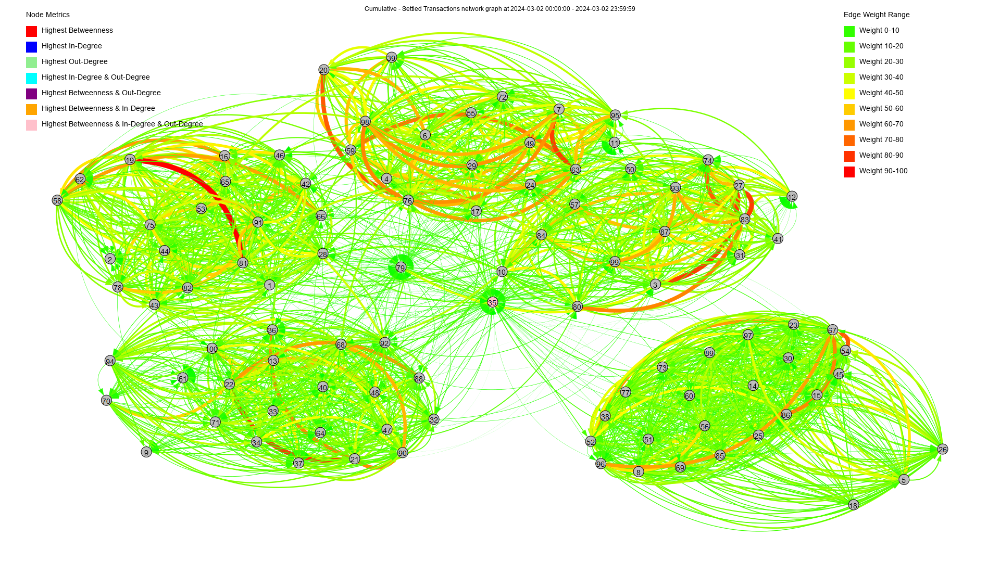

In [145]:
network_graph.create_final_image_cumulative()

*Uitleg*: clusters, hubs, exotische markt, andere clusters meer verweven, over algemeen normale values en dan vooral enkele uitschieters. Ook uitleggen dat er intraclust hubs zijn!

## Base Case: Failed Transactions

### Data Processing

We extract the failed transactions by taking the submitted transactions (validated transactions) for the day and removing the successfully executed transactions. The remaining transactions are the failed ones.

In [154]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df_settling = network_df[network_df['Activity'] == "Settling"].copy()
df_validating = network_df[network_df['Activity'] == "Validating"].copy()

df_failed = df_validating[~df_validating['TID'].isin(df_settling['TID'])]


In [153]:
## check if failed + settled = validating
# Concatenate df and df_settling
concatenated_df = pd.concat([df_failed, df_settling])

# Keep only the TID column and sort the DataFrames for comparison
concatenated_df_sorted = concatenated_df[['TID']].sort_values(by='TID').reset_index(drop=True)
df_validating_sorted = df_validating[['TID']].sort_values(by='TID').reset_index(drop=True)

# Check if the concatenated DataFrame is equal to df_validating
if concatenated_df_sorted.equals(df_validating_sorted):
    print("Settled transactions + failed transactions is equal to the transactions that validated (all transactions submitted for the day)")
else:
    print("Error: Settled transactions + failed transactions is not equal to the transactions that validated (all transactions submitted for the day)")

Settled transactions + failed transactions is equal to the transactions that validated (all transactions submitted for the day)


Among the failed transactions, we filter for the activity "Waiting in backlog for recycling," which indicates the moment when the transaction was unable to execute and was placed in the backlog.

In [159]:
df = network_df[
    (network_df['TID'].isin(df_failed['TID'])) & 
    (network_df['Activity'] == "Waiting in backlog for recycling")
]


### Cumulative Network Analysis Over Time

In [162]:
# Runtime +-30s
directory = "Base_case_failed_transactions"
title = "Cumulative - Failed Transactions"
videoname = "Cumulative-FailedTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

In [163]:
# Runtime +-2m33s
generate_video(directory, videoname)

Time to load 96 images: 0.55 seconds
Time to create animation: 0.75 seconds
Time to save animation: 151.60 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

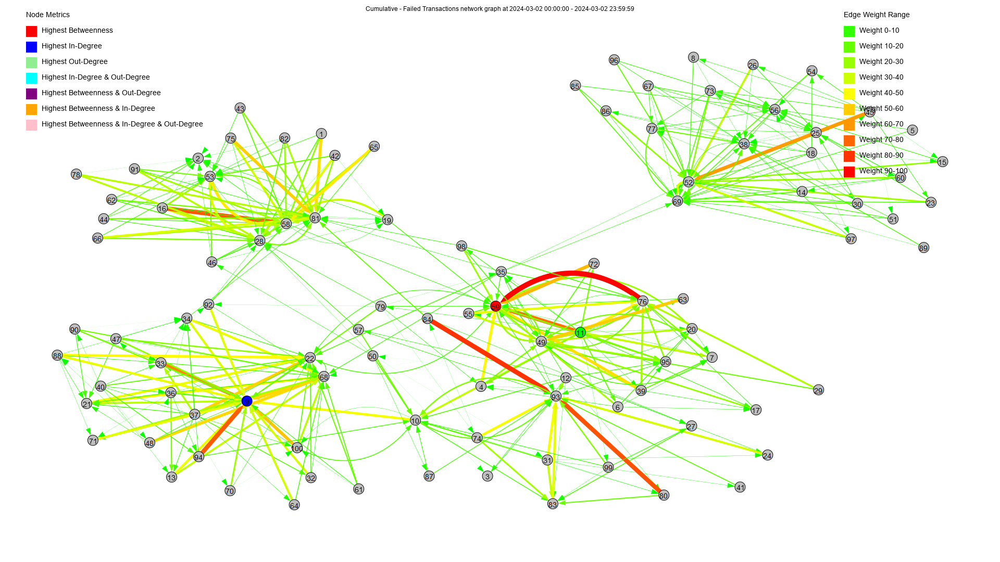

In [165]:
network_graph.create_final_image_cumulative()

*uitleg*: Stervorming!, steeds dezelfde die failen

## Case: Participant 35 frozen

In this case we freeze participant 35 ....

In [166]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog_35_5h00.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

### Cumulative Network Analysis Over Time

In [167]:
# Runtime +-1m21s
directory = "35_Case_freeze__cumulative_video" # Directory to save frames
title = "Cumulative - Settled Transactions" # Title of the frames
videoname = "35_Freeze_Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

In [168]:
# Runtime +-2m30s
generate_video(directory, videoname)

Time to load 96 images: 0.57 seconds
Time to create animation: 0.78 seconds
Time to save animation: 149.30 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

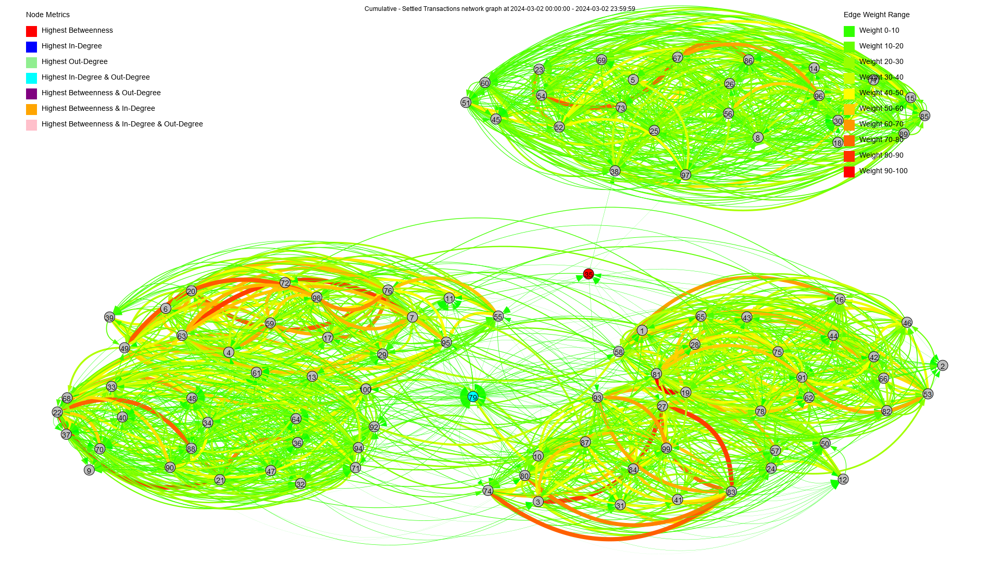

In [170]:
network_graph.create_final_image_cumulative()

*uitleg*: hier ook is community detection op! 3 clusters nu? 79 blauw geworden 35 rood ipv roos

## Case: Participant 79 frozen

In this case we freeze participant 79 ....

In [171]:
#read in eventlog
eventlog = pd.read_csv('.\DATA\eventlog_79_5h00.csv', sep=';')
#join transactions with event log
network_df = pd.merge(eventlog, securities_transactions, left_on=['TID'], right_on=['TID'], how='inner')
#filter to only keep succesful transactions
df = network_df[network_df['Activity'] == "Settling"].copy()

### Cumulative Network Analysis Over Time

In [172]:
# Runtime +-1m23s
directory = "79_Case_freeze__cumulative_video" # Directory to save frames
title = "Cumulative - Settled Transactions" # Title of the frames
videoname = "79_Freeze_Cumulative-SettledTransactions"

# Check if the directory exists, and if not, create it
if not os.path.exists(directory):
    os.makedirs(directory)

network_graph = NetworkGraph(df, directory, "top", "top", title) # Initialise the network
network_graph.create_graphs_cumulative() # Create the network and save the frames

In [173]:
# Runtime +-2m30s
generate_video(directory, videoname)

Time to load 96 images: 0.58 seconds
Time to create animation: 0.78 seconds
Time to save animation: 144.56 seconds
Video has been created and saved as 'graph_animation.mp4'.


In [ ]:
Video(f'{videoname}.mp4', embed=True, width=1920, height=1080)

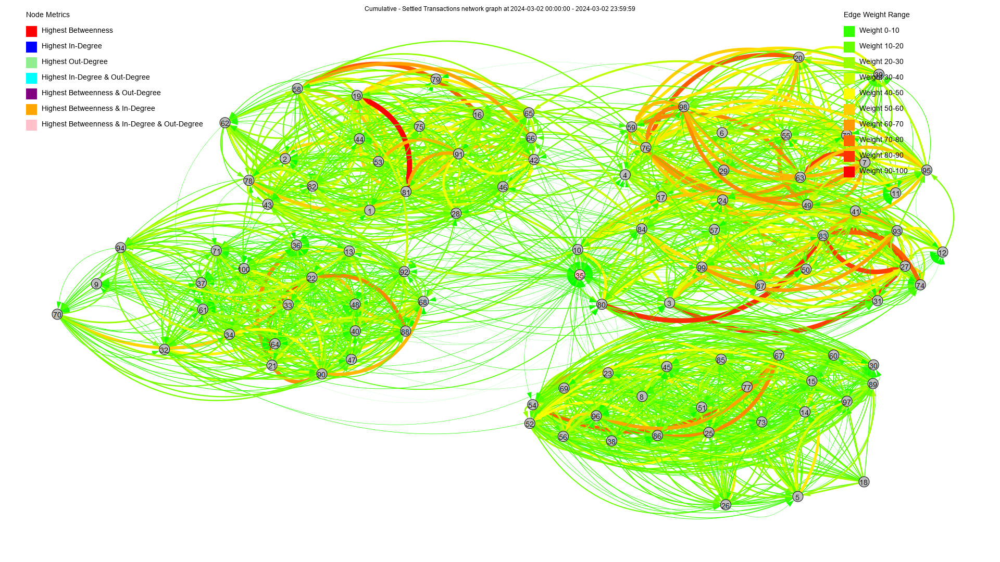

In [176]:
network_graph.create_final_image_cumulative()

*uitleg*: 10 en 80 de rol van 79 overgenomen? 35 lijkt nog belangrijker te worden

## Community detection (and edge removal?)


add short introduction about the goal of this section

In [ ]:
# df hier terug opnieuw inladen

C:\Users\victo\AppData\Local\Temp\ipykernel_15480\1809939861.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', num_communities)


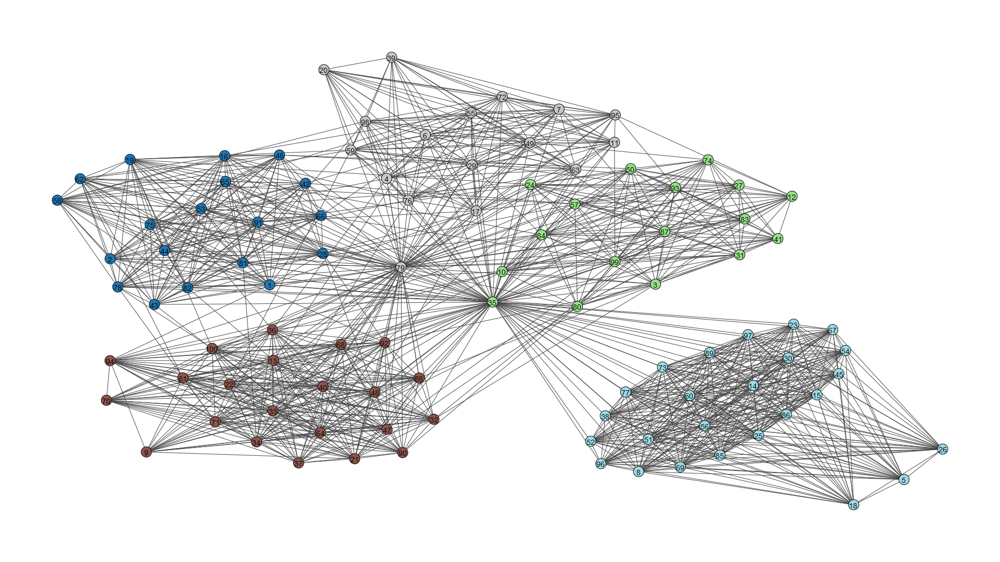

In [88]:
from IPython.display import Image, display

#load the graph (cumulative) to be analysed
directory = "image"
title = "Community detection multilevel"

def generate_community_colors(self, partition):
    num_communities = len(set(partition.membership))
    colors = plt.cm.get_cmap('tab20', num_communities)
    return [mcolors.to_hex(colors(i)) for i in range(num_communities)]

def save_graph_with_communities(self):
    current_time = self.start_day
    next_time = self.end_day

    minute_df = self.filter_dataframe(current_time, next_time)

    g = ig.Graph(directed=True)
    g.add_vertices(self.all_participants)
    g.vs['name'] = self.all_participants

    if not minute_df.empty:
        transaction_sums = self.calculate_transaction_sums(minute_df)
        self.add_edges_to_graph(g, transaction_sums)
        weights = np.array(g.es["weight"])
        normalized_weights = self.normalize_weights(weights)
        norm = mcolors.Normalize(vmin=0, vmax=100)
        edge_colors_by_weight = [mcolors.to_hex(self.custom_cmap(norm(weight))) for weight in normalized_weights]
        node_colors = self.get_node_colors(g)
    else:
        node_colors = ["grey"] * len(g.vs)
        normalized_weights = []
        edge_colors_by_weight = []

    g = g.as_undirected(combine_edges='sum')

    partition = g.community_multilevel()
    community_colors = self.generate_community_colors(partition)

    # Assigning colors to vertices based on their community membership
    for vertex in g.vs:
        vertex['color'] = community_colors[partition.membership[vertex.index]]

    visual_style = {
        'vertex_size': 20,
        'vertex_color': g.vs['color'],
        'vertex_label': g.vs['name'],
        'layout': self.fixed_layout,  # Assuming a layout is defined
        'bbox': (1920, 1080),
        'margin': 110
    }

    # Save the plot to a file
    file_name = f"{self.directory}/community_multilevel.png"
    ig.plot(g, target=file_name, **visual_style)
    self.add_title_and_legend(file_name, current_time, next_time, False)

    # Display the plot inline in the notebook
    display(Image(filename=file_name))

NetworkGraph.generate_community_colors = generate_community_colors
NetworkGraph.save_graph_with_communities = save_graph_with_communities


network_graph = NetworkGraph(df, directory,"top","top", title)

network_graph.save_graph_with_communities()

In [78]:
#load the graph (cumulative) to be analysed
directory = "image"
title = "Cumulative - Failed Transactions"

network_graph = NetworkGraph(df, directory,"top","top", title)

g, visual_style = network_graph.create_final_image_cumulative()


TypeError: cannot unpack non-iterable NoneType object

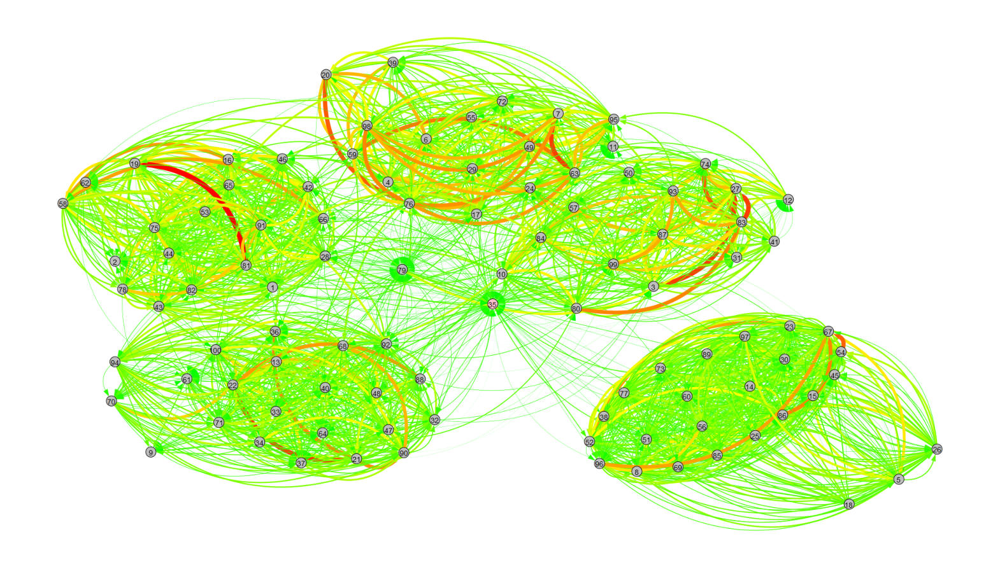

In [54]:
from igraph import drawing
# Plot the graph again with improved settings
output="graph.png"
plot(g, target=output, **visual_style)
image = Image.open(output)
plt.figure(figsize=(20, 20))  # Adjust the figure size as needed
plt.imshow(image)
plt.axis('off')  # Hide the axes
plt.show()

{'1': {'degree': 7, 'pagerank': 0.03135506680855105, 'closeness': 0.5135135135135135, 'clustering_coefficient': 1.0}, '10': {'degree': 9, 'pagerank': 0.04466084635057011, 'closeness': 0.59375, 'clustering_coefficient': 0.8}, '11': {'degree': 7, 'pagerank': 0.03255182831346163, 'closeness': 0.48717948717948717, 'clustering_coefficient': 1.0}, '12': {'degree': 7, 'pagerank': 0.03255182831346163, 'closeness': 0.48717948717948717, 'clustering_coefficient': 1.0}, '13': {'degree': 7, 'pagerank': 0.03255182831346163, 'closeness': 0.48717948717948717, 'clustering_coefficient': 1.0}, '14': {'degree': 7, 'pagerank': 0.03255182831346163, 'closeness': 0.48717948717948717, 'clustering_coefficient': 1.0}, '15': {'degree': 10, 'pagerank': 0.02399403595050491, 'closeness': 0.6333333333333333, 'clustering_coefficient': 0.5714285714285714}, '16': {'degree': 12, 'pagerank': 0.05298861434586573, 'closeness': 0.6333333333333333, 'clustering_coefficient': 0.5714285714285714}, '17': {'degree': 11, 'pagerank'

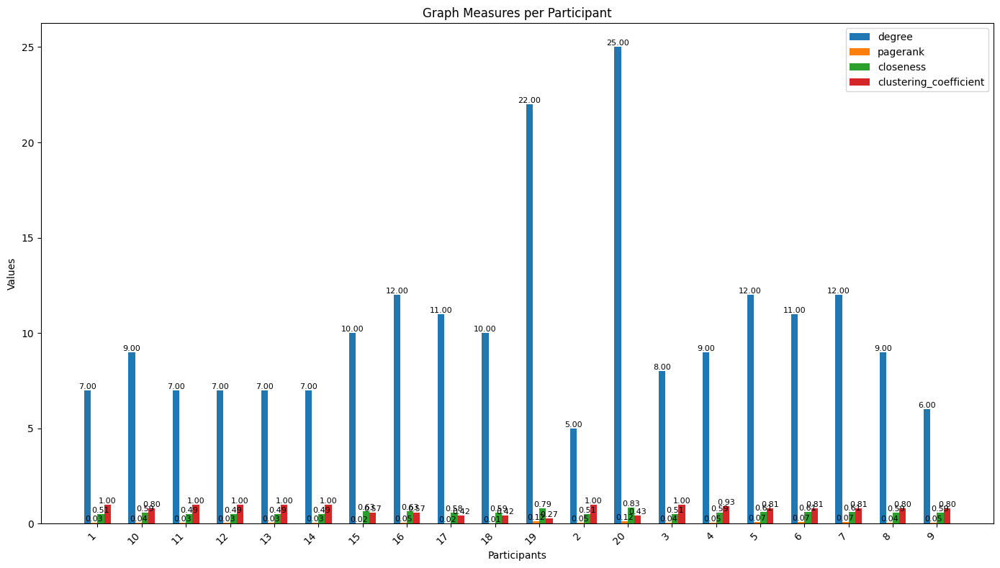

In [114]:
# Initialize the dictionary
participant_dict = {}

# Loop through each participant (vertex name) and calculate metrics
for participant in g.vs["name"]:
    participant_dict[participant] = {}  # Initialize the nested dictionary
    participant_dict[participant]["degree"] = g.degree(vertices=participant)
    #participant_dict[participant]["betweenness"] = g.betweenness(vertices=participant)
    participant_dict[participant]["pagerank"] = g.pagerank(vertices=participant)
    participant_dict[participant]["closeness"] = g.closeness(vertices=participant)
    participant_dict[participant]["clustering_coefficient"] = g.transitivity_local_undirected(vertices=participant)

# Output the resulting dictionary
print(participant_dict)
participants = list(participant_dict.keys())
measures = ["degree", "pagerank", "closeness", "clustering_coefficient"]
#measures = ["degree", "betweenness", "pagerank", "closeness", "clustering_coefficient"]

data = {measure: [participant_dict[participant][measure] for participant in participants] for measure in measures}

# Number of participants and measures
n_participants = len(participants)
n_measures = len(measures)

# Positions of the groups on the x-axis
indices = np.arange(n_participants)

# Width of each bar
bar_width = 0.15

# Plotting
fig, ax = plt.subplots(figsize=(14, 8))

for i, measure in enumerate(measures):
    bar_positions = indices + i * bar_width
    bars = ax.bar(bar_positions, data[measure], bar_width, label=measure)
    
    # Add labels to each bar
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}', ha='center', va='bottom', fontsize=8)

# Adding labels and title
ax.set_xlabel('Participants')
ax.set_ylabel('Values')
ax.set_title('Graph Measures per Participant')
ax.set_xticks(indices + bar_width * (n_measures - 1) / 2)
ax.set_xticklabels(participants, rotation=45, ha='right')
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

### Degree Distribution

Text(0.5, 1.0, 'Degree distribution')

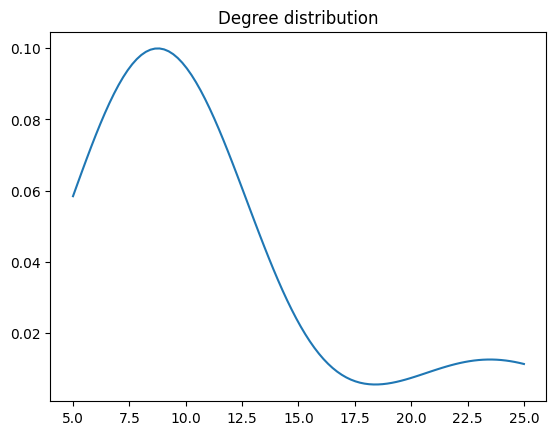

In [150]:
# Estimation of the probability denstity function using a kernel-density estimation using Gaussian kernel
kde = gaussian_kde(degree)
# these are the values over wich your kernel will be evaluated
dist_space = np.linspace( min(degree), max(degree), 100 )
# plot the results
plt.plot( dist_space, kde(dist_space) )
plt.title("Degree distribution")

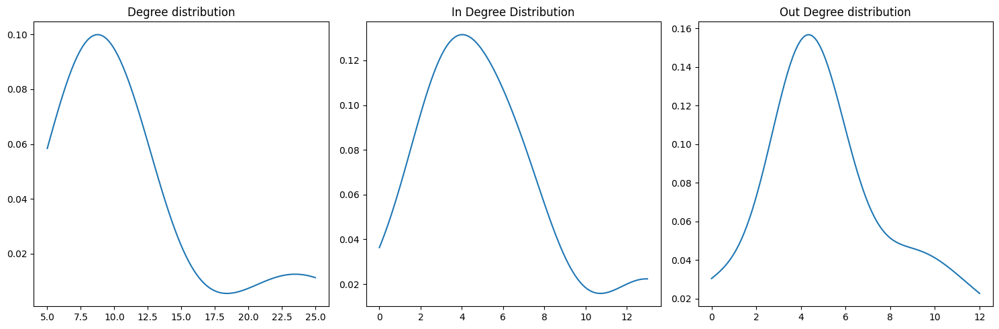

In [108]:
# Create a figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Plot 1: Degree distribution
degree=g.degree()
kde = gaussian_kde(degree)
dist_space = np.linspace( min(degree), max(degree), 100 )
axes[0].plot(dist_space, kde(dist_space))
axes[0].set_title("Degree distribution")

# Plot 2: In degree distribution
in_degree=g.indegree()
kde = gaussian_kde(in_degree)
dist_space = np.linspace( min(in_degree), max(in_degree), 100 )
axes[1].plot(dist_space, kde(dist_space))
axes[1].set_title("In Degree Distribution")

# Plot 3: Out Degree distribution
out_degree=g.outdegree()
kde = gaussian_kde(out_degree)
dist_space = np.linspace( min(out_degree), max(out_degree), 100 )
axes[2].plot(dist_space, kde(dist_space))
axes[2].set_title("Out Degree distribution")

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Betweenness Distribution

Text(0.5, 1.0, 'Betweenness distribution')

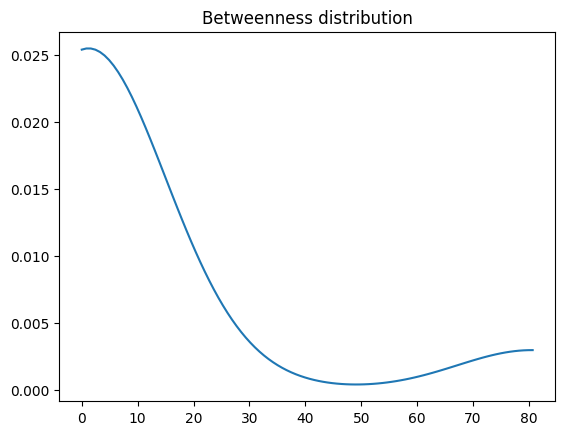

In [109]:
# Estimation of the probability denstity function using a kernel-density estimation using Gaussian kernel
btw=g.betweenness()
kde = gaussian_kde(btw)
# these are the values over wich your kernel will be evaluated
dist_space = np.linspace( min(btw), max(btw), 100 )
# plot the results
plt.plot( dist_space, kde(dist_space) )
plt.title("Betweenness distribution")

In [110]:
# Find nodes with the highest degree
max_degree_value = max(degree)
max_degree_nodes = [node for node, node_degree in enumerate(degree) if node_degree == max_degree_value]
max_degree_nodes_labels = [g.vs[node]["name"] for node in list(max_degree_nodes)]
max_degree_nodes_id = [g.vs[node]["name"] for node in list(max_degree_nodes)]


# Find nodes with the highest betweenness
max_betweenness_value = max(btw)
max_betweenness_nodes = [node for node, betweenness in enumerate(btw) if betweenness == max_betweenness_value]
max_betweenness_nodes_labels = [g.vs[node]["name"] for node in list(max_betweenness_nodes)]
max_betweenness_nodes_id = [g.vs[node]["name"] for node in list(max_betweenness_nodes)]


print(f"Nodes with the highest degree: {max_degree_nodes_labels} (Degree: {max_degree_value})")
print(f"Nodes with the highest betweenness: {max_betweenness_nodes_labels} (Betweenness: {max_betweenness_value})")

Nodes with the highest degree: ['20'] (Degree: 25)
Nodes with the highest betweenness: ['19'] (Betweenness: 80.66666666666664)


Top 3 nodes by degree: ['20', '19', '16'] (Degrees: [25, 22, 12])
Top 3 nodes by betweenness: ['19', '20', '16'] (Betweenness: [80.66666666666664, 80.40277777777779, 19.56944444444445])
Top 3 nodes by Clustering Coefficient: ['1', '11', '12'] (Betweenness: [1.0, 1.0, 1.0])


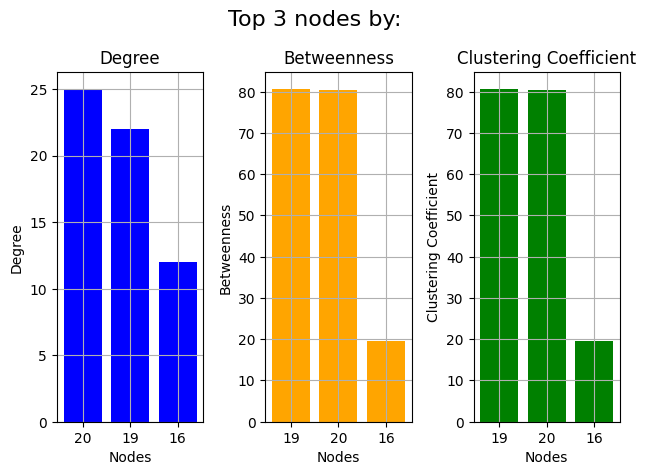

In [122]:
# Calculate degrees and betweenness centrality for all nodes
degree = g.degree()
betweenness = g.betweenness()
clustering_coeff=g.transitivity_local_undirected()

# Get the top 3 nodes by degree
top3_degree_nodes = sorted(range(len(degree)), key=lambda i: degree[i], reverse=True)[:3]
top3_degree_values = [degree[i] for i in top3_degree_nodes]
top3_degree_labels = [g.vs[i]["name"] for i in top3_degree_nodes]

# Get the top 3 nodes by betweenness
top3_betweenness_nodes = sorted(range(len(betweenness)), key=lambda i: betweenness[i], reverse=True)[:3]
top3_betweenness_values = [betweenness[i] for i in top3_betweenness_nodes]
top3_betweenness_labels = [g.vs[i]["name"] for i in top3_betweenness_nodes]

# Get the top 3 nodes by betweenness
top3_clustering_nodes = sorted(range(len(clustering_coeff)), key=lambda i: clustering_coeff[i], reverse=True)[:3]
top3_clustering_values = [clustering_coeff[i] for i in top3_clustering_nodes]
top3_clustering_labels = [g.vs[i]["name"] for i in top3_clustering_nodes]

print(f"Top 3 nodes by degree: {top3_degree_labels} (Degrees: {top3_degree_values})")
print(f"Top 3 nodes by betweenness: {top3_betweenness_labels} (Betweenness: {top3_betweenness_values})")
print(f"Top 3 nodes by Clustering Coefficient: {top3_clustering_labels} (Betweenness: {top3_clustering_values})")

# Plot for top 3 nodes by degree
plt.subplot(1, 3, 1)
plt.bar(top3_degree_labels, top3_degree_values, color='blue')
plt.title('Degree')
plt.xlabel('Nodes')
plt.ylabel('Degree')
plt.grid(True)

# Plot for top 3 nodes by betweenness
plt.subplot(1, 3, 2)
plt.bar(top3_betweenness_labels, top3_betweenness_values, color='orange')
plt.title('Betweenness')
plt.xlabel('Nodes')
plt.ylabel('Betweenness')
plt.grid(True)

# Plot for top 3 nodes by clustering coefficient
plt.subplot(1, 3, 3)
plt.bar(top3_betweenness_labels, top3_betweenness_values, color='green')
plt.title('Clustering Coefficient')
plt.xlabel('Nodes')
plt.ylabel('Clustering Coefficient')
plt.grid(True)

# Save and show the plots
plt.suptitle('Top 3 nodes by:', fontsize=16)

plt.tight_layout()
plt.savefig('top_nodes_statistics.png')
plt.show()


In [ ]:
def settlement_efficiency_betweenness():
    settlement_efficiency_df = pd.read_csv('testfiles\SE_per_participant_day_1.csv', sep=';')
    print(settlement_efficiency_df)
    nodes=g.vs["name"]
    print(g.betweenness())
    se={}
    bt={}
    for node in nodes:
        betweenness_node=g.betweenness(vertices=node)
        settlement_efficiency = settlement_efficiency_df["settled_input_ratio"][settlement_efficiency_df["FromParticipantId"]==int(node)].values[0]
        se[node] = settlement_efficiency
        print("node: ", node, ", betweenness: ",g.betweenness(vertices=node), ", Settlement efficiency: ", settlement_efficiency)
        se[node]=settlement_efficiency
        bt[node]=betweenness_node
    print(se)
    print(bt)

    nodes = se.keys()
    x_data = [se[node] for node in nodes]
    y_data = [bt[node] for node in nodes]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data)
    # Adding labels for each point
    for i, node in enumerate(nodes):
        plt.text(x_data[i], y_data[i], str(node))
    slope, intercept = np.polyfit(x_data, y_data, 1)
    trendline_x = np.linspace(min(x_data), max(x_data), 100)
    trendline_y = slope * trendline_x + intercept
    plt.plot(trendline_x, trendline_y, color='red', linestyle='--', label=f'Trendline: y={slope:.2f}x+{intercept:.2f}')

    # Adding labels and title
    plt.xlabel('Efficiency')
    plt.ylabel('Betweenness')
    plt.title('Efficiency vs Betweenness for Nodes')

    # Display the plot
    plt.grid(True)
    plt.show()

    return
settlement_efficiency_betweenness()

#### Community Detection


In [22]:
cc= g.connected_components(mode='STRONG') #--> see difference with "WEAK"
print("number of connected components " + str(len(cc)))
cc = np.array(sorted(cc, key=len, reverse=True), dtype="object")
print("largest component is " + str(len(cc[0])) + " nodes big")
print("second largest component is " + str(len(cc[1])) + " nodes big")


number of connected components 5
largest component is 13 nodes big
second largest component is 4 nodes big


In [23]:
lead = g.community_leading_eigenvector() #--> higher modularity 
lead.modularity

C:\Users\toont\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\igraph\community.py:98: RuntimeWarning: Directed graph supplied, edge directions will be ignored. at src/community/leading_eigenvector.c:392
  membership, _, q = GraphBase.community_leading_eigenvector(graph, clusters, **kwds)


0.3090771986049581

In [24]:
lead.sizes()

[5, 5, 5, 5]

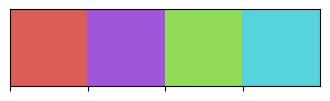

In [25]:
import seaborn as sns
k=len(lead)
colors =np.random.permutation(sns.color_palette("hls", k)).tolist()
#colors = sns.color_palette("hls", k)
sns.palplot(colors)

g.vs['color'] = [None]

for clid, cluster in enumerate(lead):
    for member in cluster:
        g.vs[member]['color'] = colors[clid]

In [35]:
for part in g.vs["name"]:
    print(part)

1
10
11
12
13
14
15
16
17
18
19
2
20
3
4
5
6
7
8
9


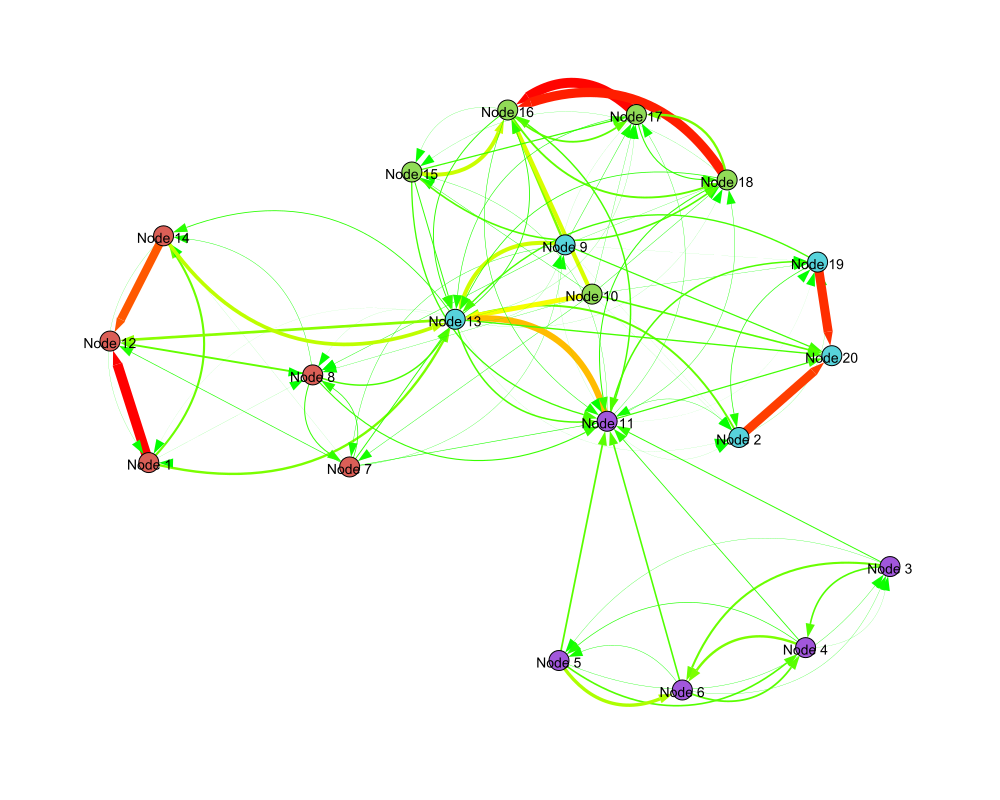

In [39]:
#Define style from network plotting

visual_style["vertex_color"] = g.vs['color']
visual_style["bbox"]= (1000, 800)
visual_style["vertex_label"]= g.vs["name"]
plt = ig.plot(g, **visual_style)

ig.plot(g, **visual_style)

## Conclusion and Gained Knowledge


## Individual Contribution

### Victor

### Toon